## Libraries

In [17]:
import json
import time
from datetime import datetime, timedelta
from dateutil import parser
import pandas as pd
import numpy as np
from collections import defaultdict
from IPython.display import display, HTML
from plotly.io import to_html
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
from google.cloud import bigquery

## Current Load

In [254]:
client = bigquery.Client()

query = (
f'''
    
SELECT
  event_publish_time AS DateTime,
  ROUND(metrics_frequency, 3) AS ApplFreqSig,
  ROUND(metrics_metered_current_load_w / 1000000.0, 4) AS Load,
  --ROUND(metrics_required_max_power_w / 1000000.0, 4) AS Pmax,
  --ROUND(metrics_required_min_power_w / 1000000.0, 4) AS Pmin,
  ROUND(metrics_metered_active_power_w / 1000000.0, 4) AS InsAcPow,
FROM
  `fever-data-prod.fever.control_log_view`
WHERE
  --event_publish_time > '2024-06-19 15:50:00.000000+00:00'
  --AND event_publish_time < '2024-06-19 16:10:00.000000+00:00'
  --event_publish_time > '2024-06-04 17:45:00.000000+00:00'
  --AND event_publish_time < '2024-06-04 18:06:00.000000+00:00'
  event_publish_time > TIMESTAMP_ADD(CURRENT_TIMESTAMP(), INTERVAL -15 MINUTE)
  AND event_publish_time < CURRENT_TIMESTAMP()
  AND asset_id = '018c2a0d-7dab-40dc-9c3f-b7e6e62c1bb9'
ORDER BY
  event_publish_time
  
''')

query_job = client.query(query)
df_current = query_job.to_dataframe()

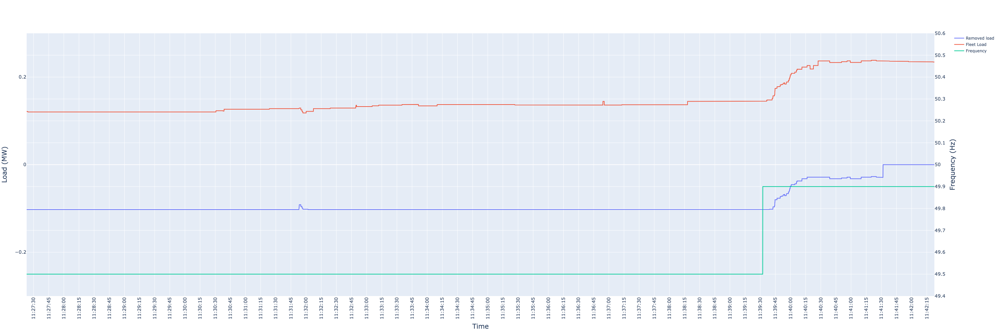

In [255]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=df_current['DateTime'], y=df_current['InsAcPow'], name="Removed load"))
fig.add_trace(go.Scatter(x=df_current['DateTime'], y=df_current["Load"], name="Fleet Load"))
fig.add_trace(go.Scatter(x=df_current['DateTime'], y=df_current['ApplFreqSig'], name="Frequency", yaxis="y2"))

fig.update_layout(
    xaxis={
        'title': {'text': 'Time', 'font': {'size': 20}},
        'tickmode': 'linear',
        'dtick': 15000,  
        'tickformat': '%H:%M:%S',  
        'tickangle': -90,  
        'tickfont': {'size': 14}  
    },
    yaxis={
        'title': {'text': 'Load (MW)', 'font': {'size': 20}},
        'range': [-0.3, 0.3],
        'dtick': 0.2,
        'tickfont': {'size': 14}  
    },
    yaxis2={
        'title': {'text': 'Frequency (Hz)', 'font': {'size': 20}},
        'overlaying': 'y',
        'side': 'right',
        'range': [49.4, 50.6],
        'dtick': 0.1,
        'tickfont': {'size': 14} 
    },
    autosize=False,
    hovermode='x',
    width=1800,
    height=1000
)

fig.show()

## Linearity Step Test (100 kW, S4, 2024-06-04)

In [213]:
client = bigquery.Client()

query = (
f'''
    
SELECT
  event_publish_time AS DateTime,
  ROUND(metrics_frequency, 3) AS ApplFreqSig,
  ROUND(metrics_metered_current_load_w / 1000000.0, 4) AS Load,
  ROUND(metrics_metered_active_power_w / 1000000.0, 4) AS InsAcPow,
FROM
  `fever-data-prod.fever.control_log_view`
WHERE
  event_publish_time > '2024-06-04 17:45:00.000000+00:00'
  AND event_publish_time < '2024-06-04 18:06:00.000000+00:00'
  AND asset_id = '018c2a0d-7dab-40dc-9c3f-b7e6e62c1bb9'
ORDER BY
  event_publish_time
  
''')

query_job = client.query(query)
df_step = query_job.to_dataframe()

In [220]:
df_step = df_step[["DateTime", "ApplFreqSig", "InsAcPow"]]
df_step.to_csv('FE_EV_SE3_STEP_TEST_FCR-D_SE4_20240604T1740-202406041810.csv')
df_step = pd.read_csv('FE_EV_SE3_STEP_TEST_FCR-D_SE4_20240604T1740-202406041810.csv', index_col=0)
df_step.to_csv('cleaned_FE_EV_SE3_2_FCR-D_SE3_20240601T0000-20240607T2359_1s_20240608.csv', index=False)

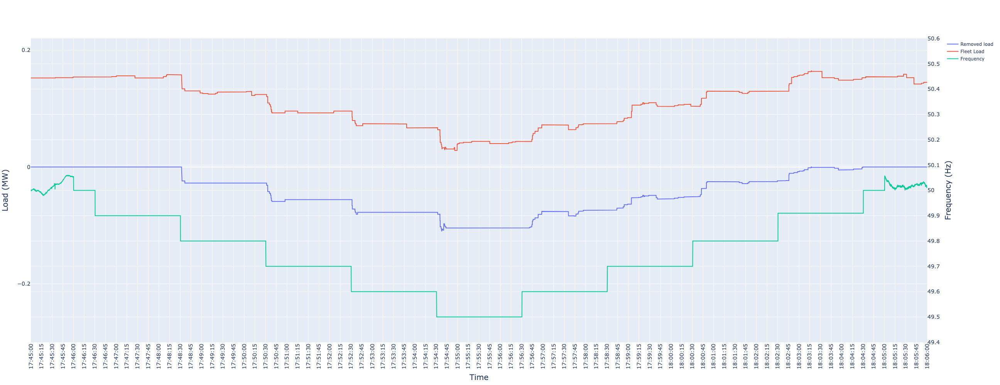

In [189]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=df_step['DateTime'], y=df_step['InsAcPow'], name="Removed load"))
fig.add_trace(go.Scatter(x=df_step['DateTime'], y=df_step["Load"], name="Fleet Load"))
fig.add_trace(go.Scatter(x=df_step['DateTime'], y=df_step['ApplFreqSig'], name="Frequency", yaxis="y2"))

fig.update_layout(
    xaxis={
        'title': {'text': 'Time', 'font': {'size': 20}},
        'tickmode': 'linear',
        'dtick': 15000,  
        'tickformat': '%H:%M:%S',  
        'tickangle': -90,  
        'tickfont': {'size': 14}  
    },
    yaxis={
        'title': {'text': 'Load (MW)', 'font': {'size': 20}},
        'range': [-0.3, 0.3],
        'dtick': 0.2,
        'tickfont': {'size': 14}  
    },
    yaxis2={
        'title': {'text': 'Frequency (Hz)', 'font': {'size': 20}},
        'overlaying': 'y',
        'side': 'right',
        'range': [49.4, 50.6],
        'dtick': 0.1,
        'tickfont': {'size': 14} 
    },
    autosize=False,
    hovermode='x',
    width=1800,
    height=1000
)

fig.show()

In [256]:
## 50 | 0 kW
## 49.9 | 0 W
## 49.8 | -27.50 kW
## 49.7 | -55.80 kW
## 49.6 | -77.47 kW
## 49.5 | -104.37 kW
## 49.6 | -75.91 kW
## 49.7 | -54.81 kW
## 49.8 | -25.030 kW
## 49.9 | -0.66 kW
## 50 | 0 kW

## Ramp response test for Statis FCR-D

In [179]:
client = bigquery.Client()

query = (
f'''
    
SELECT
  event_publish_time AS date_time,
  ROUND(metrics_frequency, 3) AS grid_freq,
  ROUND(metrics_metered_current_load_w / 1000000.0, 4) AS fleet_load_mw,
  ROUND(metrics_required_max_power_w / 1000000.0, 4) AS max_power_mw,
  ROUND(metrics_required_min_power_w / 1000000.0, 4) AS min_power_mw,
  ROUND(metrics_metered_active_power_w / 1000000.0, 4) AS active_power_mw,
FROM
  `fever-data-prod.fever.control_log_view`
WHERE
  event_publish_time > '2024-05-21 16:05:00.000000+00:00'
  AND event_publish_time < '2024-05-21 16:28:00.000000+00:00'
  --event_publish_time > TIMESTAMP_ADD(CURRENT_TIMESTAMP(), INTERVAL -20 MINUTE)
  --AND event_publish_time < CURRENT_TIMESTAMP()
  AND asset_id = '018c2a0d-7dab-40dc-9c3f-b7e6e62c1bb9'
  --AND asset_id = "98b95ea6-16e8-45de-83b1-f5676d373e8d"
ORDER BY
  event_publish_time
  
''')

query_job = client.query(query)
df_ramp = query_job.to_dataframe()

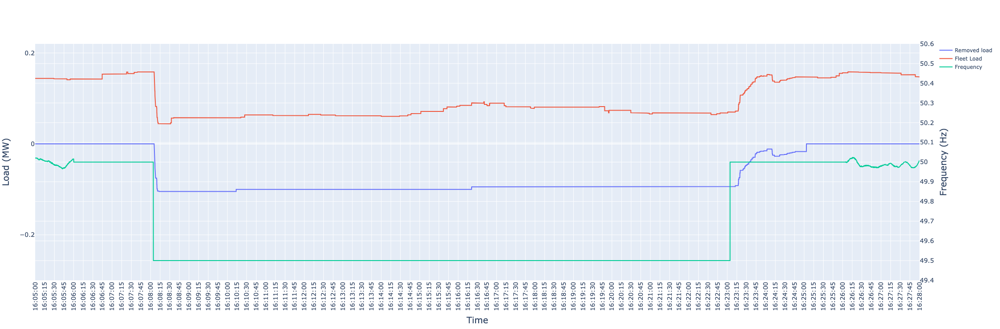

In [187]:
fig =  go.Figure()

fig.add_trace(go.Scatter(x=df_ramp['date_time'], y=df_ramp['active_power_mw'], name="Removed load"))
#fig.add_trace(go.Scatter(x=df['event_publish_time'], y=df['min_power_mw'], name="Min"))
#fig.add_trace(go.Scatter(x=df['event_publish_time'], y=df['max_power_mw'], name="Max"))
fig.add_trace(go.Scatter(x=df_ramp['date_time'], y=df_ramp["fleet_load_mw"], name="Fleet Load"))
fig.add_trace(go.Scatter(x=df_ramp['date_time'], y=df_ramp['grid_freq'], name="Frequency", yaxis="y2"))

fig.update_layout(
    xaxis={
        'title': {'text': 'Time', 'font': {'size': 20}},
        'tickmode': 'linear',
        'dtick': 15000,  # One minute in milliseconds
        'tickformat': '%H:%M:%S',  # Format the ticks to show hours, minutes, and seconds
        'tickangle': -90,  # Rotate the x-axis labels to be vertical
        'tickfont': {'size': 14}  # Change the size of the x-axis tick labels
    },
    yaxis={
        'title': {'text': 'Load (MW)', 'font': {'size': 20}},
        'range': [-0.3, 0.22],
        'dtick': 0.2,
        'tickfont': {'size': 14}  # Change the size of the y-axis tick labels
    },
    yaxis2={
        'title': {'text': 'Frequency (Hz)', 'font': {'size': 20}},
        'overlaying': 'y',
        'side': 'right',
        'range': [49.4, 50.6],
        'dtick': 0.1,
        'tickfont': {'size': 14}  # Change the size of the secondary y-axis tick labels
    },
    autosize=False,
    hovermode = 'x',
    width=1500,
    height=750)

fig.show()

## Requirements for ramp response test - manual checks

In [370]:
# Convert to publish tim
df['event_publish_time'] = pd.to_datetime(df['event_publish_time'])

# start of ramp up (min/max change
t_start = '2024-05-22 14:09:17.927000 UTC' 

# 7.5 s after ramp up 
t_7500ms = pd.to_datetime(t_start) + timedelta(seconds=7.6)

# when response has become stable
t_stable = '2024-05-22 14:09:23.952000 UTC'

# theoretical steady state power response
p_t = 50000

### Static 100 kW test variables

In [419]:
# Convert to publish tim
df['event_publish_time'] = pd.to_datetime(df['event_publish_time'])

# start of ramp up
t_start = '2024-05-21 16:08:04.753000 UTC'

# 7.5 s after ramp up 
t_7500ms = pd.to_datetime(t_start) + timedelta(seconds=7.6)

# when response has become stable
t_stable = '2024-05-21 16:08:13.261000 UTC'

# theoretical steady state power response
p_t = 100000

### Requirement 1

```
−0.1 ≤ (𝑃_1 − 𝑃_0 + |∆𝑃_𝑡ℎ𝑒𝑜𝑟𝑒𝑡𝑖𝑐𝑎𝑙|) / |∆𝑃_𝑡ℎ𝑒𝑜𝑟𝑒𝑡𝑖𝑐𝑎𝑙| ≤ 0.05
```

In [420]:
def check_requirement_1(df, t_stable, p_t):
    p_0 = df.iloc[0]['metrics_metered_active_power_w']
    p_1 = df[df['event_publish_time'] == t_stable]['metrics_metered_active_power_w'].values[0]

    val = round((p_1 - p_0 + abs(p_t)) / abs(p_t), 6)
    res = -0.1 <= val and val <= 0.05
    
    print(f"Requirement: -0.1 <= {val} <= 0.05 [{res}]")
    
    return res

In [421]:
check_requirement_1(df, t_stable, p_t)

Requirement: -0.1 <= -0.045576 <= 0.05 [True]


True

### Requirement 2

```
|∆𝑃7.5s| ≥ 0.86 ∙ |∆𝑃𝑠𝑠,𝑡ℎ𝑒𝑜𝑟𝑒𝑡𝑖𝑐𝑎𝑙|
```

In [422]:
def check_requirement_2(df, t_start, t_7500ms, p_t):
    p_7500ms = abs(df[df['event_publish_time'] < t_7500ms].iloc[-1]['metrics_metered_active_power_w'])
    val = 0.86 * abs(p_t)
    res = p_7500ms >=  0.86 * val

    print(f"\nt_start = {t_start}\nt_7500ms = {t_7500ms}\n|p_7500ms| = {p_7500ms}\n|val| = {val}")
    print(f"\nRequirement: {p_7500ms} >= 0.86 * {p_t} [{res}]")

    return res

In [423]:
check_requirement_2(df, t_start, t_7500ms, p_t)


t_start = 2024-05-21 16:08:04.753000 UTC
t_7500ms = 2024-05-21 16:08:12.353000+00:00
|p_7500ms| = 103719.57335197831
|val| = 86000.0

Requirement: 103719.57335197831 >= 0.86 * 100000 [True]


True

### Requirement 3

```
|𝐸7.5s| ≥ 3.2𝑠 ∙ |∆_𝑡ℎ𝑒𝑜𝑟𝑒𝑡𝑖𝑐𝑎𝑙|
```

In [424]:
def check_requirement_3(t_start, t_7500ms):
    
    filtered_df = df[(df['event_publish_time'] >= t_start) & (df['event_publish_time'] <= t_7500ms)]
    filtered_df = filtered_df.sort_values('event_publish_time')
    
    interval_seconds = (filtered_df['event_publish_time'] - filtered_df['event_publish_time'].iloc[0]).dt.total_seconds()
    first_timestamp = interval_seconds.iloc[0]
    last_timestamp = interval_seconds.iloc[-1]
    power_values = filtered_df['metrics_metered_active_power_w']
    
    e_7_5s_trapz = np.trapz(power_values, interval_seconds)
    print(f"\n|E_7_5s| over time interval [{first_timestamp}, {last_timestamp}]: {abs(e_7_5s_trapz)} (trapz)")
    
    # Manual calculation
    e_7_5s_manual = 0
    for i in range(1, len(interval_seconds)):
        e_7_5s_manual += (interval_seconds.iloc[i] - interval_seconds.iloc[i-1]) * (power_values.iloc[i-1])
    
    delta = round((e_7_5s_manual - e_7_5s_trapz) / e_7_5s_manual * 100, 2)
    print(f"|E_7_5s| over time interval [{first_timestamp}, {last_timestamp}]: {abs(e_7_5s_manual)} (manual) (delta = {delta}%)")

    res = abs(e_7_5s_manual) >=  3.2 * p_t

    print(f"{abs(e_7_5s_manual)} >= 3.2 * 100000 [{res}]")

    return res


In [425]:
check_requirement_3(t_start, t_7500ms)


|E_7_5s| over time interval [0.0, 7.518]: 485107.48183298594 (trapz)
|E_7_5s| over time interval [0.0, 7.518]: 479329.46039228584 (manual) (delta = -1.21%)
479329.46039228584 >= 3.2 * 100000 [True]


True